In [1]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2


import torch
import torch.nn as nn
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
from torch.cuda.amp import autocast, GradScaler
import timm

import random
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
import pandas as pd
from sklearn.utils.class_weight import compute_class_weight

from sklearn import metrics
from sklearn.metrics import roc_auc_score
import segmentation_models_pytorch as smp
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

def seed_everything(seed=123):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
seed_everything()

from pytorch_toolbelt import losses as L

In [2]:
def get_cut_transform(img_size):
    return A.Compose([
        #A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Transpose(p=0.5),
        #A.Blur(blur_limit=3, p=0.5),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit= 30,
                                        interpolation=cv2.INTER_LINEAR, border_mode=2, p=0.5),
        A.RandomCrop(img_size, img_size, p=1),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, p=1),
    ])

In [3]:
class rice_dataset(Dataset):
    
    def __init__(self, img_name, label, state='train', cutmix=False, transforms=None):
        
        self.img_name= img_name
        self.state= state
        if self.state=='train':
            self.label= label
        self.transforms= transforms
        self.cutmix= cutmix
        
    def __getitem__(self, index):
        
        if self.state=='train':
            name= self.img_name[index]
            label= self.label[index]

            img= cv2.imread(name)
            img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            mask= cv2.imread(label, 0)/255

            aug= self.transforms(image= img, mask= mask)
            img, mask= aug['image'], aug['mask']
            
            # use cutmix
            if self.cutmix and np.random.rand()>=0.5:
                img= img.permute(1,2,0).numpy()
                mask= mask.numpy()
                
                rand_index= np.random.randint(len(self.img_name))
                name_1= self.img_name[rand_index]
                label_1= self.label[rand_index]
                img_1= cv2.imread(name_1)
                img_1= cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
                mask_1= cv2.imread(label_1, 0)/255
                
                size= np.random.randint(10, int(img.shape[0])-10)
                aug= get_cut_transform(size)
                transform= aug(image= img_1, mask= mask_1)
                img_1, mask_1= transform['image'], transform['mask']
                
                while True:
                    rand_xcoord= np.random.randint(img.shape[0])
                    rand_ycoord= np.random.randint(img.shape[1])
                    try:
                        img[rand_xcoord:rand_xcoord+size, rand_ycoord:rand_ycoord+size]= img_1
                        mask[rand_xcoord:rand_xcoord+size, rand_ycoord:rand_ycoord+size]= mask_1
                        break
                    except:
                        pass
                    
                img= torch.tensor(img, dtype= torch.float32).permute(2,0,1)
            
            mask= mask.reshape(mask.shape[0], mask.shape[0], 1)
            mask= torch.tensor(mask, dtype= torch.float32)
            mask= mask.permute(2,0,1)
            
            
            return img, mask
        else:
            name= self.img_name[index]
            img= cv2.imread(name)
            img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            origin_shape= img.shape
            
            aug= self.transforms(image= img)
            img= aug['image']
        
            return name, img, origin_shape
    
    def __len__(self):
        return len(self.img_name)

In [4]:
def get_train_transform(img_size):
    return A.Compose([
        #A.RandomBrightnessContrast(brightness_limit=0, contrast_limit=0.1, p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Transpose(p=0.5),
        #A.Blur(blur_limit=3, p=0.5),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.05, rotate_limit= 180,
                                        interpolation=cv2.INTER_LINEAR, border_mode=2, p=0.5),
        #A.CoarseDropout(p=0.5),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, p=1),
        ToTensorV2(p=1.0),
    ])

def get_test_transform(img_size):
    return A.Compose([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, p=1),
        ToTensorV2(p=1.0),
    ] )

# train

In [5]:
CFG= {
    'model_name': 'timm-regnetx_032',
    'n_fold': 5,
    'lr': 3e-4,
    'epoch': 20,
    'batch_size': 8,
    'img_size': 512,
    'cutmix': True,
    'load_model': ''#'SSL_pretrain_weight'
}

In [6]:
from sklearn.model_selection import StratifiedKFold, KFold, GroupKFold

# training dataset
all_img_name= os.listdir('Train_Dev/training_img/split_img_512')
all_label_name= ['Train_Dev/training_mask/split_mask_512/'+name.split('.j')[0]+'.jpg' for name in all_img_name]
all_img_name= ['Train_Dev/training_img/split_img_512/'+name for name in all_img_name]
all_img_name= np.array(all_img_name)
all_label_name= np.array(all_label_name)


# development dataset PL
all_img_name_1= os.listdir('Train_Dev/dev_img_crop')
all_label_name_1= ['Train_Dev/dev_mask_crop/'+name for name in all_img_name_1]
all_img_name_1= ['Train_Dev/dev_img_crop/'+name for name in all_img_name_1]


#test public dataset PL
all_img_name_2= os.listdir('test_dataset/test_img_crop')
all_label_name_2= ['test_dataset/test_mask_crop/'+name for name in all_img_name_2]
all_img_name_2= ['test_dataset/test_img_crop/'+name for name in all_img_name_2]


kf= KFold(n_splits= CFG['n_fold'], shuffle=True, random_state= 42)

In [7]:
for cv, (train_index, vali_index) in enumerate(kf.split(all_img_name, all_label_name)):
    if cv!=0: continue
    print('start cv: ', str(cv))
    
    train_img= all_img_name[train_index]
    #train_img= np.array( list(train_img) + all_img_name_1 )
    #train_img= np.array( list(train_img) + all_img_name_2 )
    train_label= all_label_name[train_index]
    #train_label= np.array( list(train_label) + all_label_name_1 )
    #train_label= np.array( list(train_label) + all_label_name_2 )

    
    vali_img= all_img_name[vali_index]
    vali_label= all_label_name[vali_index]
    
    
    train_dataset= rice_dataset(train_img,
                                train_label,
                                'train',
                                CFG['cutmix'],
                                get_train_transform(CFG['img_size']))
    
    vali_dataset= rice_dataset(vali_img,
                               vali_label,
                               'train',
                               False,
                               get_test_transform(CFG['img_size']))
   
    
    ENCODER = CFG['model_name']
    ENCODER_WEIGHTS = 'imagenet'
    ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multicalss segmentation
    DEVICE = 'cuda'

    # create segmentation model with pretrained encoder
    if CFG['load_model']=='':
        model = smp.UnetPlusPlus(
            encoder_name=ENCODER, 
            encoder_weights=ENCODER_WEIGHTS, 
            classes= 1, 
            activation=ACTIVATION,
        )
    else:
        model= torch.load(CFG['load_model']+'/model_cv_'+str(cv)+'.pth')
        print('load_model')
    
    
    train_loader = DataLoader(train_dataset, batch_size= CFG['batch_size'], shuffle=True, num_workers=0)
    valid_loader = DataLoader(vali_dataset, batch_size=1, shuffle=False, num_workers=0)
    
    
    loss = smp.utils.losses.DiceLoss()
    #loss= L.DiceLoss(mode='binary')
    #loss= L.BinaryFocalLoss()
    #loss= L.SoftBCEWithLogitsLoss(smooth_factor= 0.2)
    """
    loss= L.JointLoss(L.DiceLoss(mode='binary'),
                                L.BinaryFocalLoss(),
                                first_weight=0.5,
                                second_weight=0.5)
                                """
    #loss.__name__ = 'soft_bce'
    
    metrics = [
        smp.utils.metrics.Fscore(threshold= 0.5),
    ]
    optimizer = torch.optim.Adam([ 
        dict(params=model.parameters(), lr=CFG['lr']),
    ])
    
    
    model.train()
    train_epoch = smp.utils.train.TrainEpoch(
        model, 
        loss=loss, 
        metrics=metrics, 
        optimizer=optimizer,
        device=DEVICE,
        verbose=True,
    )

    model.eval()
    valid_epoch = smp.utils.train.ValidEpoch(
        model, 
        loss=loss, 
        metrics=metrics, 
        device=DEVICE,
        verbose=True,
    )
    

    max_score = 0
    for i in range(CFG['epoch']):

        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)

        # do something (save model, change lr, etc.)
        if max_score < valid_logs['fscore']:
            max_score = valid_logs['fscore']
            torch.save(model, 'train_cv_model/model_cv_'+str(cv)+'.pth')
            print('Model saved at: ', max_score)

        if i == 10:
            model= torch.load('train_cv_model/model_cv_'+str(cv)+'.pth')
            optimizer.param_groups[0]['lr'] = 3e-5
            print('Decrease decoder learning rate to 3e-5!')

start cv:  0


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-regnet/regnetx_032-ed0c7f7e.pth" to C:\Users\foresight/.cache\torch\hub\checkpoints\regnetx_032-ed0c7f7e.pth




Epoch: 0
train:   0%|                                                                                    | 0/98 [00:00<?, ?it/s]

C:\Users\foresight\miniconda3\lib\site-packages\ipykernel_launcher.py:55: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


valid: 100%|█████████████████████████████████████| 196/196 [00:09<00:00, 20.26it/s, dice_loss - 0.786, fscore - 0.3629]
Model saved at:  0.3629164501341786

Epoch: 1
valid: 100%|████████████████████████████████████| 196/196 [00:09<00:00, 20.52it/s, dice_loss - 0.6634, fscore - 0.4262]
Model saved at:  0.42619350521287425

Epoch: 2
valid: 100%|████████████████████████████████████| 196/196 [00:09<00:00, 20.52it/s, dice_loss - 0.6396, fscore - 0.4362]
Model saved at:  0.43623270719025387

Epoch: 3
valid: 100%|████████████████████████████████████| 196/196 [00:09<00:00, 20.14it/s, dice_loss - 0.6036, fscore - 0.4211]

Epoch: 4
valid: 100%|█████████████████████████████████████| 196/196 [00:09<00:00, 20.43it/s, dice_loss - 0.598, fscore - 0.4257]

Epoch: 5
valid: 100%|████████████████████████████████████| 196/196 [00:09<00:00, 20.43it/s, dice_loss - 0.6136, fscore - 0.4231]

Epoch: 6
valid: 100%|████████████████████████████████████| 196/196 [00:09<00:00, 19.74it/s, dice_loss - 0.6027, fscore 

KeyboardInterrupt: 

# Validation

In [8]:
valid_CFG= {
    'model': 'train_cv_model',
}

start cv:  0
load_model


C:\Users\foresight\miniconda3\lib\site-packages\ipykernel_launcher.py:55: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


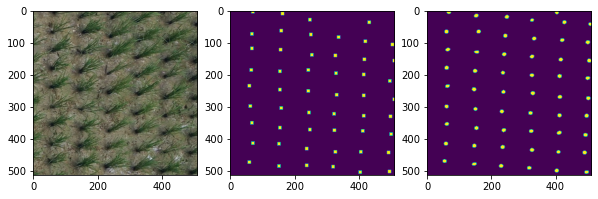

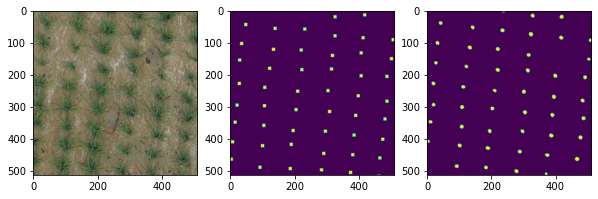

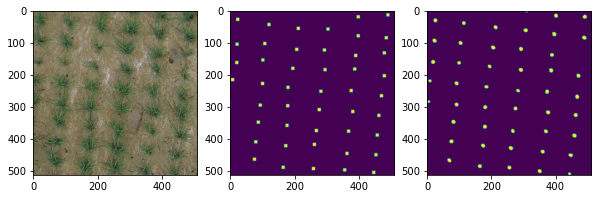

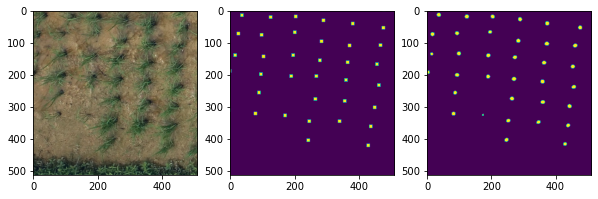

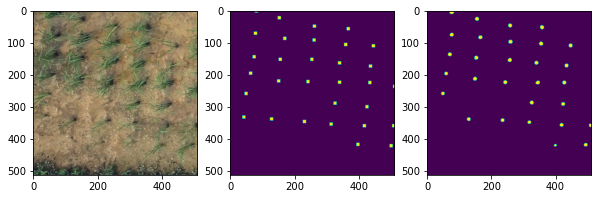

...

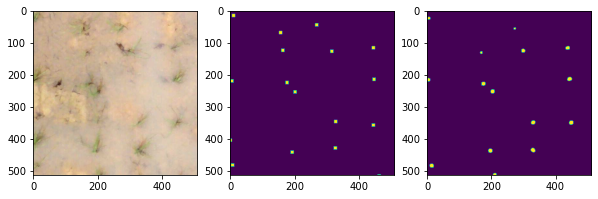

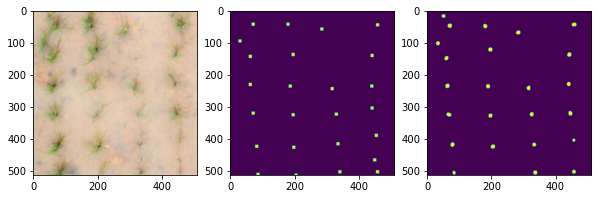

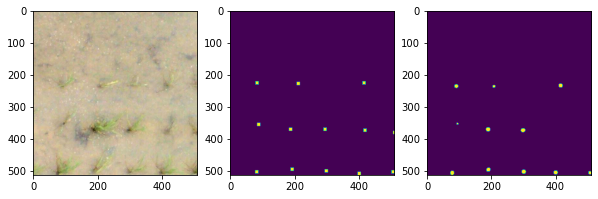

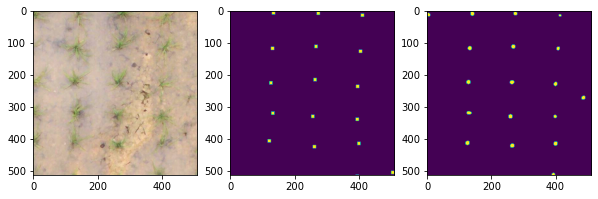

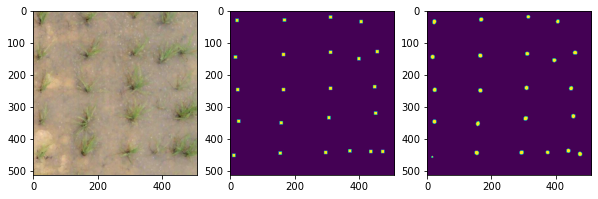

In [9]:
for cv, (train_index, vali_index) in enumerate(kf.split(all_img_name, all_label_name)):
    if cv!=0: continue
    print('start cv: ', str(cv))
    
    vali_img= all_img_name[vali_index]
    vali_label= all_label_name[vali_index]
    
    
    vali_dataset= rice_dataset(vali_img,
                               vali_label,
                               'train',
                               False,
                               get_test_transform(512))
   

    model= torch.load(valid_CFG['model']+'/model_cv_'+str(cv)+'.pth')
    print('load_model')
    
    
    valid_loader = DataLoader(vali_dataset, batch_size=1, shuffle=False, num_workers=0)
    
    
    model.eval()
    for img, mask in valid_loader:
        
        img= img.cuda()
        
        with torch.no_grad():
            predict= model(img).cpu()
        predict[predict>=0.5]= 1
        predict[predict<0.5]= 0
        
        img= img.cpu()
        img= img-img.min()
        img/= img.max()
        for i in range(len(predict)):
            if predict[i].max()>0.5 or mask[i].max()>0.5:
                plt.figure(figsize=(10,10))
                plt.subplot(1,3,1)
                plt.imshow(img[i].permute(1,2,0))
                plt.subplot(1,3,2)
                plt.imshow(mask[i][0])
                plt.subplot(1,3,3)
                plt.imshow(predict[i][0]*255)
                plt.show()
            else:
                continue
        

# Test

In [ ]:
from skimage.measure import label, regionprops
from skimage.filters import threshold_otsu
import matplotlib.patches as mpatches
from skimage.morphology import square, dilation, erosion
import time

def transform_center(img, ans):
    
    ans= ans*255

    ans= ans.reshape(ans.shape[0],ans.shape[1])
    try:
        thresh = threshold_otsu(ans)
    except:
        return ''
    bw = dilation(ans > thresh, square(11)) #11
    bw = erosion(bw > thresh, square(11))
    label_image = label(bw, connectivity = 2)
    plt.imshow(bw)
    plt.show()

    """
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img.reshape(img.shape[0],img.shape[1],3), cmap= 'gray')
    """
    
    # 紀錄所有區域之面積
    area=[]
    for region in regionprops(label_image):
        minr, minc, maxr, maxc = region.bbox
        x_width= maxc - minc
        y_width= maxr - minr
        area.append(x_width*y_width)
    # 排序大小
    index_large= sorted(range(len(area)), key = lambda k : area[k])
    index_large.reverse()
    region_prob= []
    for i in range(len(regionprops(label_image))):
        region_prob.append( regionprops(label_image)[index_large[i]] )
    
    #region_prob= region_prob[:int(len(region_prob)*0.9)]
        
        
    all_center= []
    print('region_bbox: ', len(region_prob))
    for region in region_prob:
        minr, minc, maxr, maxc = region.bbox
        x_width= maxc - minc
        y_width= maxr - minr
        minr= minr-y_width/2
        minc= minc-x_width/2
        x_width= x_width*2
        y_width= y_width*2
        
        
        if (maxc - minc)>0 and (maxr - minr)>0:
            all_center.append([int(minc+x_width/2), int(minr+y_width/2)])
            """
            rect = mpatches.Rectangle((minc, minr), x_width, y_width,
                                        fill=False, edgecolor='red', linewidth=2)
            ax.add_patch(rect)
            """
            
            
    #plt.show()
    
    return all_center

# test_crop_img

['train_cv_model/model_cv_0.pth']
test_model:  model_cv_0.pth


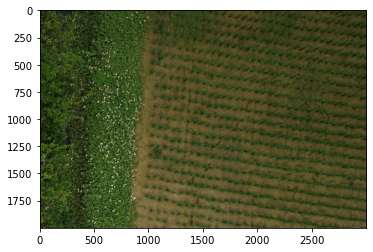

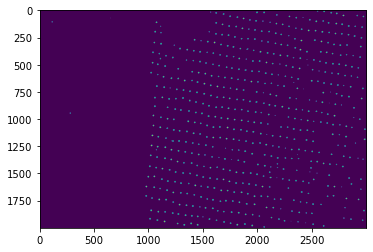

test_model:  model_cv_0.pth


KeyboardInterrupt: 

In [10]:
import albumentations as A
import matplotlib.pyplot as plt
import os
import pandas as pd
import numpy as np
from torch.utils.data import DataLoader
import cv2
import torch
from pytorch_toolbelt.inference.tiles import ImageSlicer, TileMerger
from pytorch_toolbelt.utils.torch_utils import to_numpy, image_to_tensor
from pytorch_toolbelt.inference import tta


test_CFG= {
    'img_path': 'test_dataset/test_img',
    'img_size': int(512),
    'model_path': 'train_cv_model',
    'overlap_step': 128,
    'threshold': 0.5,
}


model_name= os.listdir(test_CFG['model_path'])
model_name= [test_CFG['model_path']+'/'+name for name in model_name]
print(model_name)


def get_test_transform():
    return A.Compose([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, p=1),
    ] )


test_name= os.listdir(test_CFG['img_path'])
test_name= [test_CFG['img_path']+'/'+name for name in test_name]


for name in test_name[8:]:
    
    image= cv2.imread(name)
    image_origin= cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image= image_origin
    #image= get_test_transform()(image= image_origin)['image']


    # Cut large image into overlapping tiles
    step= test_CFG['overlap_step']
    tiler = ImageSlicer(image.shape, tile_size=(test_CFG['img_size'], test_CFG['img_size']), tile_step=(step, step))

    # HCW -> CHW. Optionally, do normalization here
    tiles = [tile for tile in tiler.split(image)]
    tiles= [ image_to_tensor(get_test_transform()(image= tile)['image']) for tile in tiles ]

    # Allocate a CUDA buffer for holding entire mask
    merger = TileMerger(tiler.target_shape, 1, tiler.weight)

    cv_mask= np.zeros_like(image)[:,:,0].astype(np.float16)
    for model in model_name:
        print('test_model: ', model.split('/')[-1])
        model= torch.load(model)
        model.eval()
        # Run predictions for tiles and accumulate them
        for tiles_batch, coords_batch in DataLoader(list(zip(tiles, tiler.crops)), batch_size=1, pin_memory=True):
            tiles_batch = tiles_batch.float().cuda()
            with torch.no_grad():
                pred_batch = model(tiles_batch)
                #pred_batch= tta.fliplr_image2mask(model, tiles_batch)
                #pred_batch= tta.d4_image2mask(model, tiles_batch)
                #pred_batch= pred_batch.sigmoid()
                #print(pred_batch.max())

            merger.integrate_batch(pred_batch, coords_batch)

        # Normalize accumulated mask and convert back to numpy
        merged_mask = np.moveaxis(to_numpy(merger.merge()), 0, -1).astype(np.float16)
        merged_mask = tiler.crop_to_orignal_size(merged_mask)
        cv_mask+= merged_mask.reshape(merged_mask.shape[0], merged_mask.shape[1])
        
    cv_mask/= len(model_name)
    
    threshold= test_CFG['threshold']
    cv_mask[cv_mask>=threshold]= 1
    cv_mask[cv_mask<threshold]= 0
    
    #cv2.imwrite('test_dataset/test_mask_PL/'+name.split('/')[-1][:-3]+'jpg', cv_mask.astype(np.uint8)*255)
        

    plt.imshow(image_origin)
    plt.show()
    plt.imshow(cv_mask.astype(np.uint8))
    plt.show()

    #key_point= transform_center(image, cv_mask)
    #ans= pd.DataFrame(np.array(key_point))
    #ans.to_csv('submission/'+name.split('/')[-1].split('.J')[0]+'.csv', index= False, header=False)